In [1]:
import os
import sys
sys.path.append(os.path.dirname(os.getcwd()))

import numpy as np
import h5py
from scipy.stats import binned_statistic_2d
from math import ceil, sqrt
from itertools import permutations
import warnings
from scipy.ndimage import gaussian_filter
from sklearn.preprocessing import normalize
from scipy.io import loadmat
import matplotlib.pyplot as plt

try:
    from analysis.config import h5_path_dict
    from analysis.ExpData import ExpData
except:
    warnings.warn("Emily's experimental data could not be loaded.")

from sr_model.utils import pol2cart, downsample
from datasets import inputs

engram_dir = "/home/chingf/engram/Ching/"

In [2]:
data_dir = f'{engram_dir}payne_et_al_2021_data/'
titmouse_data = [f for f in os.listdir(data_dir) if f.startswith('HT')]

In [3]:
import pandas as pd
cm_to_bin = 5
fps = 3
num_steps = 6000 #np.inf
num_states = 14*14

In [42]:
def get_onehot_states(contin_xs, contin_ys):
    """
    Given (T,) size xyz vectors, returns (num_states, T) one-hot encoding
    of the associated state at each time point.
    """

    xs = np.digitize(contin_xs, np.arange(0, 70, cm_to_bin)) - 1
    ys = np.digitize(contin_ys, np.arange(0, 70, cm_to_bin)) - 1
    arena_length = 70/cm_to_bin
    states = (xs*arena_length + ys).astype(int)

    # Find runs
    run_starts = []
    run_ends = []
    prev_state = None
    run_length = 0 # 5 seconds is 5*3 = 15 frames
    for frame, state in enumerate(states):
        if prev_state == state:
            run_length += 1
        else:
            if run_length >= 15:
                run_starts.append(frame - run_length) # Inclusive
                run_ends.append(frame) # Exclusive
            run_length = 1
            prev_state = state

    # Exclude stationary points
    exclude_points = []
    for r_start, r_end in zip(run_starts, run_ends):
        exclude_points += range(r_start+1, r_end)
    xs = np.delete(xs, exclude_points)
    ys = np.delete(ys, exclude_points)
    states = np.delete(states, exclude_points)

    # Truncate if needed
    if (num_steps != np.inf) and (xs.size > num_steps):
        start_idx = np.random.choice(xs.size - (num_steps+1))
        xs = xs[start_idx:start_idx+num_steps]
        ys = ys[start_idx:start_idx+num_steps]
        states = states[start_idx:start_idx+num_steps]

    # Format into encoding
    encoding = np.zeros((num_states, xs.size))
    encoding[states, np.arange(states.size)] = 1
    return xs, ys, encoding

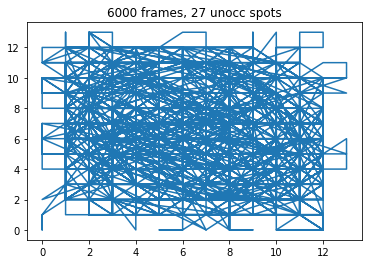

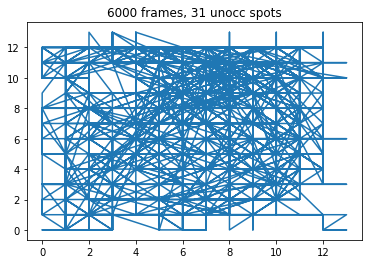

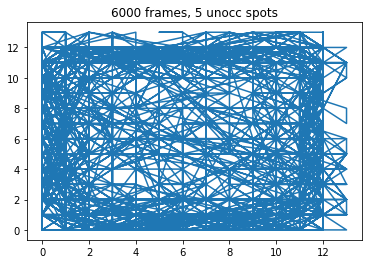

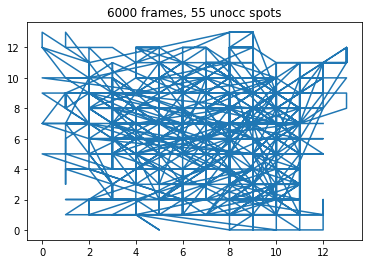

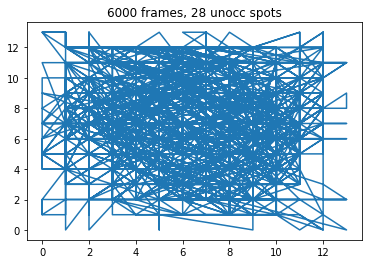

...

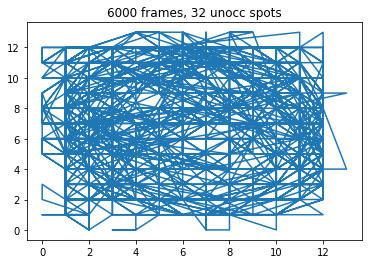

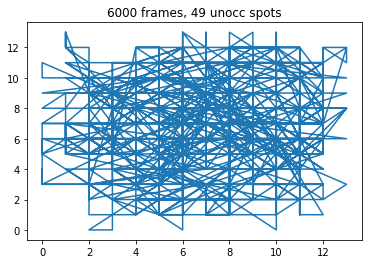

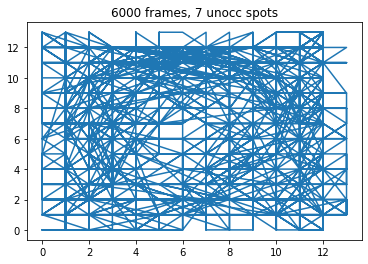

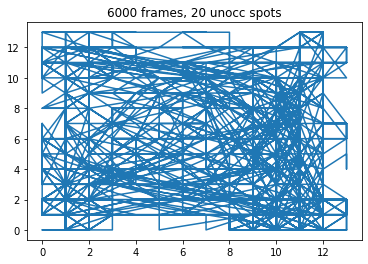

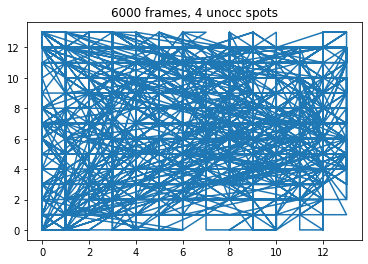

In [43]:
exp_lens = []
n_unoccupied = []
for idx, session in enumerate(titmouse_data):
    path = data_dir + session
    data = loadmat(path)['B'][0,0]
    exp_fps = data[0][0,0]
    exp_xs = data[1].squeeze()
    exp_ys = data[2].squeeze()
    exp_xs = pd.Series(exp_xs).interpolate().ffill().bfill().to_numpy()
    exp_ys = pd.Series(exp_ys).interpolate().ffill().bfill().to_numpy()
    
    contin_xs = exp_xs[::int(exp_fps/fps)]
    contin_ys = exp_ys[::int(exp_fps/fps)]
    contin_xs -= contin_xs.min()
    contin_ys -= contin_ys.min()
    max_pixel = max(contin_xs.max(), contin_ys.max())
    contin_xs = (contin_xs/max_pixel)*69
    contin_ys = (contin_ys/max_pixel)*69
    num_states = int((70/cm_to_bin) ** 2)
    xs, ys, dg_inputs = get_onehot_states(contin_xs, contin_ys)
    
    exp_len = dg_inputs.shape[1]
    n_unocc = np.sum(np.sum(dg_inputs, axis=1) < 3)
    plt.figure()
    plt.plot(xs, ys)
    plt.title(f'{exp_len} frames, {n_unocc} unocc spots')
    plt.show()
    exp_lens.append(exp_len)
    n_unoccupied.append(n_unocc)
    

(array([  2.,   0.,   1.,   1.,   0.,   2.,   2.,   0.,   0., 168.]),
 array([4374. , 4536.6, 4699.2, 4861.8, 5024.4, 5187. , 5349.6, 5512.2,
        5674.8, 5837.4, 6000. ]),
 <BarContainer object of 10 artists>)

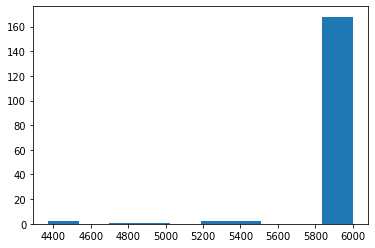

In [44]:
plt.hist(exp_lens)

(array([0.19318182, 0.15909091, 0.18181818, 0.19318182, 0.10227273,
        0.125     , 0.03409091, 0.        , 0.00568182, 0.00568182]),
 array([ 2. , 10.8, 19.6, 28.4, 37.2, 46. , 54.8, 63.6, 72.4, 81.2, 90. ]),
 <BarContainer object of 10 artists>)

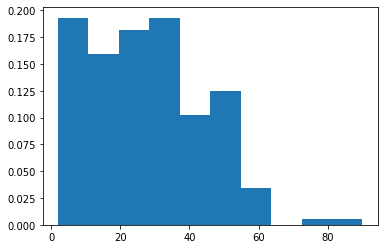

In [45]:
plt.hist(n_unoccupied, weights=[1/len(n_unoccupied)]*len(n_unoccupied))

In [46]:
np.sum(np.array(n_unoccupied) < 30)/len(n_unoccupied)

0.5454545454545454

In [4]:
from datasets import inputs, sf_inputs_discrete 

In [5]:
dataset = sf_inputs_discrete.TitmouseWalk

In [7]:
feature_maker_kwargs = {                                                
    'feature_dim': num_states, 'feature_type': 'correlated_distributed',
    'feature_vals_p': [1-0.001, 0.001],                       
    'spatial_sigma': 0.
    }                                                                   
dataset_config = {                                                      
    'num_steps': 5001, 'feature_maker_kwargs': feature_maker_kwargs,
    'num_states': 14*14
    }  

In [8]:
dset = dataset(**dataset_config)

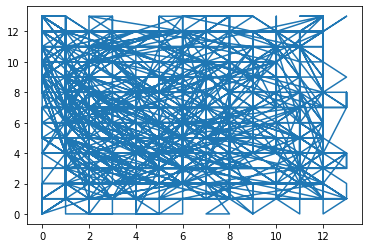

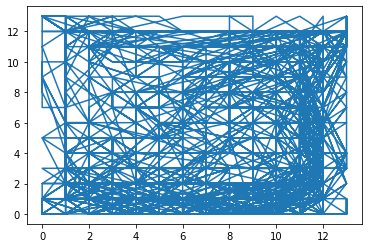

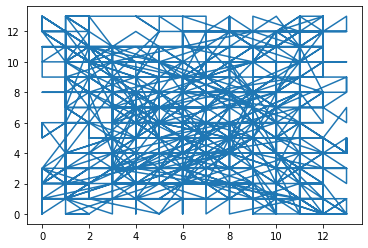

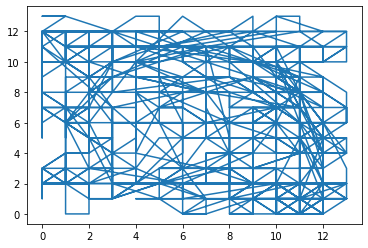

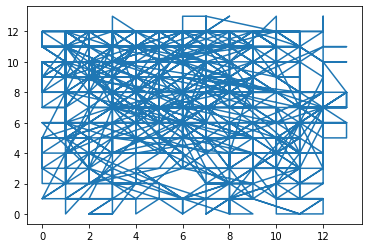

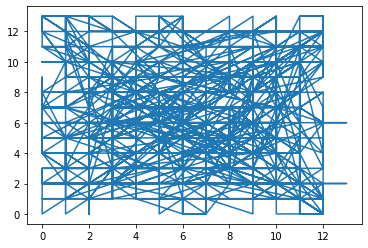

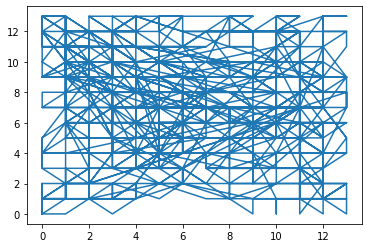

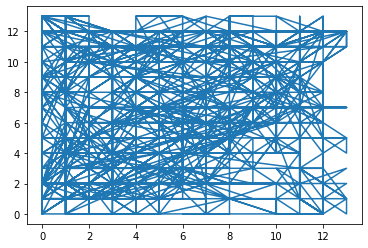

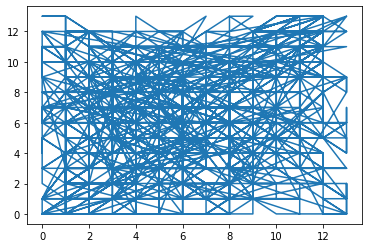

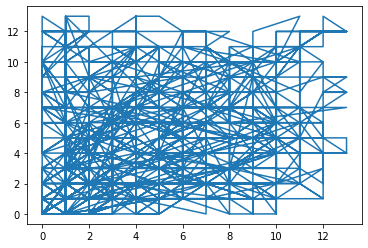

In [10]:
for _ in range(10):
    dset = dataset(**dataset_config)
    plt.figure();
    plt.plot(dset.xs, dset.ys)
    plt.show()